<a href="https://colab.research.google.com/github/amanmeka/DataScience/blob/main/AmanMekaU6proj.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

You need to submit a .ipynb file with the first four letters of one first name, the first four letters of one last name, and U6proj.

Ex.

A student named Avy Aguacate Avocado Palta will submit a file named "Avy_AvocU6proj.ipynb", since she normally just goes by Avy, and, when pressed, reports Avocado as her last name. The " _ " after "Avy" serves as the fourth "letter" in her first name.

Ex2.

Army Armadillo will submit a file named "ArmyArmaU6proj.ipynb"

# Unit 6 Project: Making a Generalized Linear Model (multiple predictors)

**Task**:

Two parts:

1. Propose a data set that's compatible with a generilized linear model structure built with pymc and/or bambi. Your data must have more than three potential predictor variables. I must approve your submission before you move on to part 2.

2. Create, analyze, and present a generalized linear model using pymc within the colab environment, on a data set of your choice, with the following conditions:
  - your final model must have more than 2 predictors. The intercept term doesn't count as a predictor here (even though technically it is).
  - You must document and explain your model selection method. This means you must show that your likelihood/link function combo is better than at least one other choice of likelihood/link function.
  - You must document and explain your variable selection method. This means you must show that your final model is better than at least one other version of the model with a different selection of variables.



In [2]:
import numpy as np
import pandas as pd
import arviz as az
import pymc as pm
import graphviz as gv
import matplotlib.pyplot as plt
import seaborn as sns

For this project I chose to model the basketball data from the 24-25 NBA season. However, instead of being boring and only looking at normal statistics, I added a few advanced statistics and fantasy points. For those who don't know, fantasy points is a scoring system that converts a player's real-life basketball statistics (e.g. points, rebounds, assists, steals, blocks, turnovers, etc.) into a numerical value to determine the winner in fantasy leagues. I was curious to see how the way that fantasy points are derived affects the relationship that it has with each individual variable

In [3]:
link = "https://raw.githubusercontent.com/amanmeka/DataScience/refs/heads/main/2425nba%20-%202425nba%20(4).csv"
bball = pd.read_csv(link)

In [ ]:
bball

,Rk,Player,Age,Team,Pos,G,GS,MP,FG,FGA,...,AST,STL,BLK,TOV,PF,PTS,FPTS,TS,Awards,Player-additional
0,1,Shai Gilgeous-Alexander,26,OKC,PG,76,76,34.2,11.3,21.8,...,6.4,1.7,1.0,2.4,2.2,32.7,58.5,68.88,MVP-1DPOY-10CPOY-8ASNBA1,gilgesh01
1,2,Giannis Antetokounmpo,30,MIL,PF,67,67,34.2,11.8,19.7,...,6.5,0.9,1.2,3.1,2.3,30.4,57.5,68.99,MVP-3DPOY-8ASNBA1,antetgi01
2,3,Nikola Jokić,29,DEN,C,70,70,36.7,11.2,19.5,...,10.2,1.8,0.6,3.3,2.3,29.6,69.4,70.79,MVP-2CPOY-2ASNBA1,jokicni01
3,4,Luka Dončić,25,LAL,PG,28,28,35.1,8.8,20.0,...,7.5,1.6,0.4,3.7,2.4,28.2,51.2,64.21,NaN,doncilu01
4,4,Luka Dončić,25,2TM,PG,50,50,35.4,9.2,20.5,...,7.7,1.8,0.4,3.6,2.5,28.2,53.1,63.40,NaN,doncilu01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
714,565,Riley Minix,24,SAS,SF,1,0,7.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.00,NaN,minixri01
715,566,Jahlil Okafor,29,IND,C,1,0,3.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,3.0,0.00,NaN,okafoja01
716,567,Zyon Pullin,23,MEM,SG,3,0,1.0,0.0,0.3,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.3,0.00,NaN,pullizy01
717,568,Isaiah Stevens,24,MIA,PG,3,0,2.0,0.0,0.7,...,0.0,0.3,0.0,0.0,0.0,0.0,1.2,0.00,NaN,steveis01


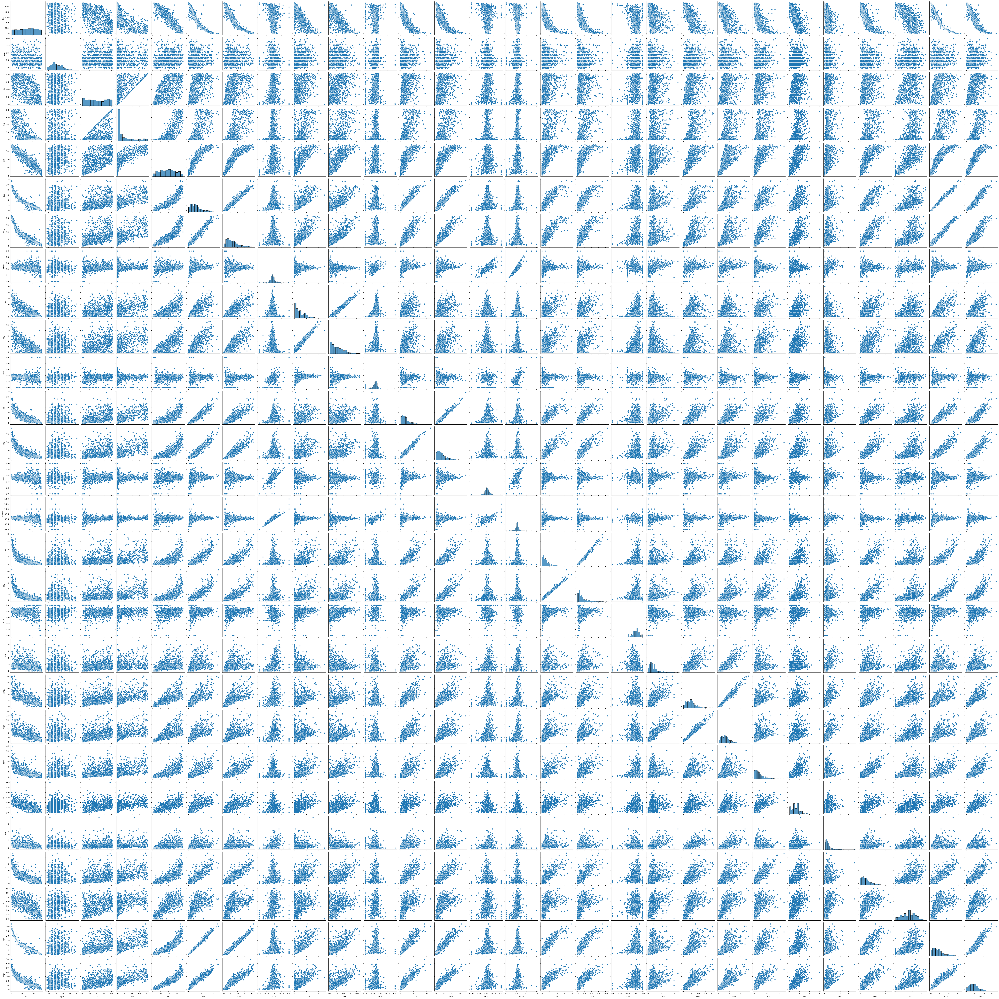

In [ ]:
sns.pairplot(bball)

This pair plot might look like a mess but the only row that I am going to be looking at is FPTS because I want to look at the relationships between FPTS and the other variables

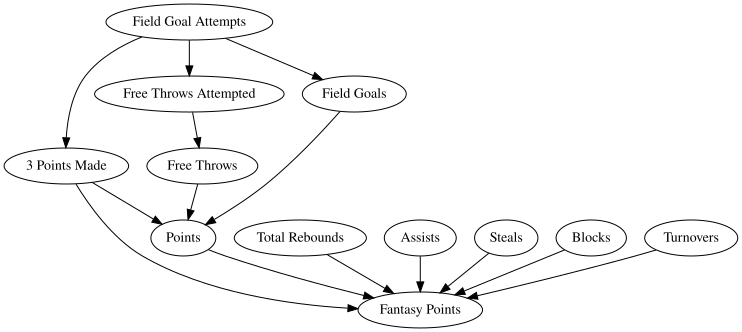

In [ ]:
#multiple predictor causal diagram
dag_b = gv.Digraph(comment='bikes_dag') #b for bikes

dag_b.node('A', 'Fantasy Points')
dag_b.node('B', 'Field Goals')
dag_b.node('C','Field Goal Attempts')
dag_b.node('D','3 Points Made')
dag_b.node('E', 'Free Throws')
dag_b.node('F', 'Free Throws Attempted')
dag_b.node('G', 'Total Rebounds')
dag_b.node('H', 'Assists')
dag_b.node('I', 'Steals')
dag_b.node('J', 'Blocks')
dag_b.node('K', 'Turnovers')
dag_b.node('L', 'Points')



dag_b.edges(['CB','CD','CF','BL','DL','DA','FE','EL','HA','IA','KA','JA','GA','LA'])

dag_b

Now although this direct acyclic graph might look overly compilcated, the relationships between each variable that is shown is strong. Your field goals are a product of the amount of fild goal attempts (which also goes for 3 points made). Free throws attempted also correlates with field goal attempts because the more field goal attempts you have, the more likely you are to have been fouled while shooting. Free throws comes from free throw attempts (obviously). Fantasy Points is calculated (atleast the most popular way) with this formula:

(PTS × 1) + (FT × 1) - (FTA × 1) + (FG × 2) - (FGA × 1) + (3P × 1) + (TRB × 1) + (AST × 2) + (STL × 4) + (BLK ×4) - (TO × 2),

therefore, all of the variables affect the number of fantasy points directly.

#Reference

In [5]:
!pip install bambi

In [6]:
import bambi as bmb

In [7]:
fpts_model = bmb.Model("'FPTS' ~ 'FG' + 'FGA' + '3P' + 'FT' + 'FTA' + 'TRB' + 'PTS' + 'AST' + 'STL' + 'BLK' + 'TOV'" , bball, family="gaussian")

I am using FG, FGA, 3P, FT, FTA, TRB, PTS, AST, STL, BLK, TOV in this first reference model

In [ ]:
fpts_model

       Formula: 'FPTS' ~ 'FG' + 'FGA' + '3P' + 'FT' + 'FTA' + 'TRB' + 'PTS' + 'AST' + 'STL' + 'BLK' + 'TOV'
        Family: gaussian
          Link: mu = identity
  Observations: 719
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 18.4976, sigma: 128.9374)
            FG ~ Normal(mu: 0.0, sigma: 12.802)
            FGA ~ Normal(mu: 0.0, sigma: 6.1951)
            3P ~ Normal(mu: 0.0, sigma: 32.8917)
            FT ~ Normal(mu: 0.0, sigma: 22.1134)
            FTA ~ Normal(mu: 0.0, sigma: 18.0267)
            TRB ~ Normal(mu: 0.0, sigma: 12.5809)
            PTS ~ Normal(mu: 0.0, sigma: 4.5813)
            AST ~ Normal(mu: 0.0, sigma: 16.3751)
            STL ~ Normal(mu: 0.0, sigma: 70.3497)
            BLK ~ Normal(mu: 0.0, sigma: 76.2029)
            TOV ~ Normal(mu: 0.0, sigma: 36.3138)
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 11.8282)

In [14]:
#this is bambi's equivalent of pm.sample()
idata_model1 = fpts_model.fit(idata_kwargs={"log_likelihood":True})

Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


#Second Model

In [8]:
fpts_model_2 = bmb.Model("'FPTS' ~ 'Age' + 'MP' + 'FG' + 'FGA' + '3P' + '3PA' + '2P' + '2PA' + 'FT' + 'FTA' + 'ORB' + 'DRB' + 'TRB' + 'AST' + 'STL' + 'BLK' + 'TOV' + 'PF' + 'PTS' + 'TS'" , bball, family="gaussian")

In [9]:
fpts_model_2

       Formula: 'FPTS' ~ 'Age' + 'MP' + 'FG' + 'FGA' + '3P' + '3PA' + '2P' + '2PA' + 'FT' + 'FTA' + 'ORB' + 'DRB' + 'TRB' + 'AST' + 'STL' + 'BLK' + 'TOV' + 'PF' + 'PTS' + 'TS'
        Family: gaussian
          Link: mu = identity
  Observations: 719
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 18.4976, sigma: 293.8614)
            Age ~ Normal(mu: 0.0, sigma: 7.1881)
            MP ~ Normal(mu: 0.0, sigma: 3.1553)
            FG ~ Normal(mu: 0.0, sigma: 12.802)
            FGA ~ Normal(mu: 0.0, sigma: 6.1951)
            3P ~ Normal(mu: 0.0, sigma: 32.8917)
            3PA ~ Normal(mu: 0.0, sigma: 12.7541)
            2P ~ Normal(mu: 0.0, sigma: 16.345)
            2PA ~ Normal(mu: 0.0, sigma: 9.1453)
            FT ~ Normal(mu: 0.0, sigma: 22.1134)
            FTA ~ Normal(mu: 0.0, sigma: 18.0267)
            ORB ~ Normal(mu: 0.0, sigma: 39.2011)
            DRB ~ Normal(mu: 0.0, sigma: 16.8028)
            TRB ~ Normal(mu: 0.0, sig

In [15]:
#this is bambi's equivalent of pm.sample()
idata_model2 = fpts_model_2.fit(idata_kwargs={"log_likelihood":True})

Output()

ERROR:pymc.stats.convergence:There were 1000 divergences after tuning. Increase `target_accept` or reparameterize.
ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


#model 3 (offensive stats)


In [10]:
fpts_model_3 = bmb.Model("'FPTS' ~ 'FG' + 'FGA' + '3P' + '3PA' + '2P' + '2PA' + 'FT' + 'FTA' + 'AST' + 'PTS' + 'TS'" , bball, family="gaussian")

In [11]:
fpts_model_3

       Formula: 'FPTS' ~ 'FG' + 'FGA' + '3P' + '3PA' + '2P' + '2PA' + 'FT' + 'FTA' + 'AST' + 'PTS' + 'TS'
        Family: gaussian
          Link: mu = identity
  Observations: 719
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 18.4976, sigma: 184.9363)
            FG ~ Normal(mu: 0.0, sigma: 12.802)
            FGA ~ Normal(mu: 0.0, sigma: 6.1951)
            3P ~ Normal(mu: 0.0, sigma: 32.8917)
            3PA ~ Normal(mu: 0.0, sigma: 12.7541)
            2P ~ Normal(mu: 0.0, sigma: 16.345)
            2PA ~ Normal(mu: 0.0, sigma: 9.1453)
            FT ~ Normal(mu: 0.0, sigma: 22.1134)
            FTA ~ Normal(mu: 0.0, sigma: 18.0267)
            AST ~ Normal(mu: 0.0, sigma: 16.3751)
            PTS ~ Normal(mu: 0.0, sigma: 4.5813)
            TS ~ Normal(mu: 0.0, sigma: 2.5079)
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 11.8282)

In [16]:
#this is bambi's equivalent of pm.sample()
idata_model3 = fpts_model_3.fit(idata_kwargs={"log_likelihood":True})

Output()

#model 4 (defensive stats)

In [12]:
fpts_model_4 = bmb.Model("'FPTS' ~ 'ORB' + 'DRB' + 'TRB' + 'STL' + 'BLK' + 'TOV' + 'TS'" , bball, family="gaussian")

In [13]:
fpts_model_4

       Formula: 'FPTS' ~ 'ORB' + 'DRB' + 'TRB' + 'STL' + 'BLK' + 'TOV' + 'TS'
        Family: gaussian
          Link: mu = identity
  Observations: 719
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 18.4976, sigma: 175.923)
            ORB ~ Normal(mu: 0.0, sigma: 39.2011)
            DRB ~ Normal(mu: 0.0, sigma: 16.8028)
            TRB ~ Normal(mu: 0.0, sigma: 12.5809)
            STL ~ Normal(mu: 0.0, sigma: 70.3497)
            BLK ~ Normal(mu: 0.0, sigma: 76.2029)
            TOV ~ Normal(mu: 0.0, sigma: 36.3138)
            TS ~ Normal(mu: 0.0, sigma: 2.5079)
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 11.8282)

In [17]:
#this is bambi's equivalent of pm.sample()
idata_model4 = fpts_model_4.fit(idata_kwargs={"log_likelihood":True})

Output()

#elpd_loo check

<Axes: title={'center': 'Model comparison\nhigher is better'}, xlabel='elpd_loo (log)', ylabel='ranked models'>

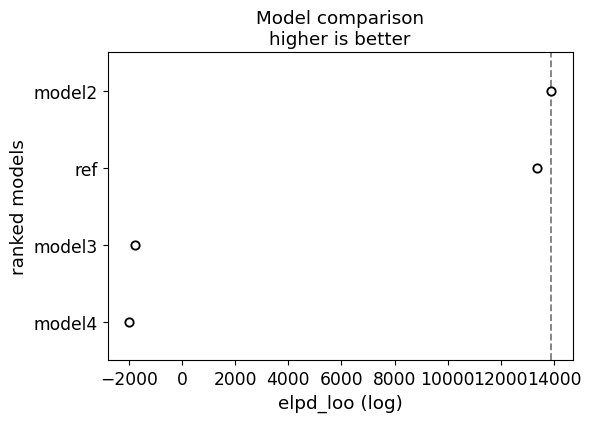

In [18]:
check = az.compare({"ref": idata_model1, "model2": idata_model2, "model3": idata_model3, "model4": idata_model4})
az.plot_compare(check)

looking at the reference model and the second model, it seems that the second model has a much more positive elpd_loo value which can be associated with a better fitting to the data.